In [1]:
import time
from datetime import datetime
import vectorbt as vbt

import pandas as pd
import pandas_ta as ta
import numpy as np
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv('EURUSD_15m.csv')
data.tail()

,timestamp,open,high,low,close,adj close,volumn
15369,2022-06-30 16:45:00+01:00,1.046682,1.048438,1.046572,1.047120,1.047120,0
15370,2022-06-30 17:00:00+01:00,1.047120,1.047340,1.046463,1.046792,1.046792,0
15371,2022-06-30 17:15:00+01:00,1.046682,1.047779,1.046682,1.047669,1.047669,0
15372,2022-06-30 17:30:00+01:00,1.047889,1.048218,1.047230,1.047449,1.047449,0
15373,2022-06-30 17:45:00+01:00,1.047779,1.048878,1.047779,1.048438,1.048438,0


In [3]:
df = data.copy()
df['timestamp'] = pd.to_datetime(df['timestamp'], utc=True).dt.tz_localize(None)
df

,timestamp,open,high,low,close,adj close,volumn
0,2021-11-04 17:00:00,1.154734,1.155135,1.154734,1.155135,1.155135,0
1,2021-11-04 17:15:00,1.155135,1.155535,1.155001,1.155135,1.155135,0
2,2021-11-04 17:30:00,1.155001,1.155535,1.155001,1.155135,1.155135,0
3,2021-11-04 17:45:00,1.155001,1.155535,1.155001,1.155001,1.155001,0
4,2021-11-04 18:00:00,1.155135,1.155535,1.155135,1.155535,1.155535,0
...,...,...,...,...,...,...,...
15369,2022-06-30 15:45:00,1.046682,1.048438,1.046572,1.047120,1.047120,0
15370,2022-06-30 16:00:00,1.047120,1.047340,1.046463,1.046792,1.046792,0
15371,2022-06-30 16:15:00,1.046682,1.047779,1.046682,1.047669,1.047669,0
15372,2022-06-30 16:30:00,1.047889,1.048218,1.047230,1.047449,1.047449,0


In [24]:
def add(a, b, c):
    global curr
    if (a % 2 == 1):
        curr = a
    print(curr)
    return a + b + c

In [26]:
data = {
        'A':[1, 2, 3],
        'B':[4, 5, 6],
        'C':[7, 8, 9] }
     
df = pd.DataFrame(data)
# print("Original DataFrame:\n", df)
     
curr = 0
df['add'] = df.apply(lambda row : add(row['A'], row['B'], row['C']), axis = 1)
  
print('\nAfter Applying Function: ')
print(df.shift(1))

1
1
3

After Applying Function: 
     A    B    C   add
0  NaN  NaN  NaN   NaN
1  1.0  4.0  7.0  12.0
2  2.0  5.0  8.0  15.0


In [72]:
dt = pd.DataFrame(zip(*[range(10)]), columns=['num'])
dt

,num
0,0
1,1
2,2
3,3
4,4
5,5
6,6
7,7
8,8
9,9


In [73]:
def example(x):
    if x['num'] % 2 == 0:
        x['p1'] = x['num']**2
    x['p2'] = x['num']**3
    x['p3'] = x['num']**4
    return x

dt = dt.apply(example, axis=1)
dt

,num,p1,p2,p3
0,0.0,0.0,0.0,0.0
1,1.0,NaN,1.0,1.0
2,2.0,4.0,8.0,16.0
3,3.0,NaN,27.0,81.0
4,4.0,16.0,64.0,256.0
5,5.0,NaN,125.0,625.0
6,6.0,36.0,216.0,1296.0
7,7.0,NaN,343.0,2401.0
8,8.0,64.0,512.0,4096.0
9,9.0,NaN,729.0,6561.0


In [95]:
class RSI_and_EMA:
    def __init__(self, params):
        
        self.current_action = 'close'
        self.atr = params['atr']
        self.ema = params['ema']
        self.rsi = params['rsi']
        
        self.overbought = params['overbought']
        self.oversold = params['oversold']
        self.rr = params['rr']
        
        self.df = params['df']
        self.pip = params['pip']
        self.pip_value = params['pip_value']
        self.target_tp = params['target_tp']
        
        self.latest_sl = 0
        self.latest_tp = 0
        
    def get_df(self):
        return self.df
    
    def calLotSize(self, entry, exit):
        return abs(round(self.target_tp / (entry - exit)  , 2))
#         return abs(round(self.target_tp / (((entry - exit) / self.pip ) * self.pip_value ) , 2))
        
    def createLongOrders(self, row):
        if self.current_action == 'close':
            if row['EMA_'+str(self.ema)] < row['low'] and row['RSI_'+str(self.rsi)] > self.overbought and \
                    row['prev_rsi'] < self.overbought:
                
                row['entries'] = True
                self.current_action = 'long'
                
                self.latest_sl = row['low'] - row['ATRr_'+str(self.atr)]
                self.latest_tp = row['open'] + (self.rr * abs(row['open'] - self.latest_sl))
                row['lot_size'] = self.calLotSize(row['open'], self.latest_tp)
        
        else:
            if row['low'] <= self.latest_sl:
                    self.current_action = 'close'
                    row['exits'] = True
                    row['price_action'] = self.latest_sl
                    row['lot_size'] = 0
                    
            elif row['high'] >= self.latest_tp:
                    self.current_action = 'close'
                    row['exits'] = True
                    row['price_action'] = self.latest_tp
                    row['lot_size'] = 0
        
        return row
    
    def createShortOrders(self, row):
        if self.current_action == 'close':
            if row['EMA_'+str(self.ema)] > row['high'] and row['RSI_'+str(self.rsi)] < self.oversold and \
                    row['prev_rsi'] > self.oversold:
                    
                row['short_entries'] = True
                self.current_action = 'short'
                
                self.latest_sl = row['high'] + row['ATRr_'+str(self.atr)]
                self.latest_tp = row['open'] - (self.rr * abs(row['open'] - self.latest_sl))
                row['lot_size'] = self.calLotSize(row['open'], self.latest_tp)
    
        else:
            if row['high'] >= self.latest_sl:
                    self.current_action = 'close'
                    row['short_exits'] = True
                    row['price_action'] = self.latest_sl
                    row['lot_size'] = 0
                    
            elif row['low'] <= self.latest_tp:
                    self.current_action = 'close'
                    row['short_exits'] = True
                    row['price_action'] = self.latest_tp
                    row['lot_size'] = 0
                    
        return row
                    
    def createStrategy(self):
        rsi_ema = ta.Strategy(
            name = 'RSI 14 Days for opposite trade',
            description = 'RSI for alert',
            ta = [
                {'kind': 'ema', 'length': self.ema},
                {'kind': 'rsi', 'length': self.rsi},
                {'kind': 'atr', 'length': self.atr}
            ]
        )
        self.df.ta.strategy(rsi_ema)
        
        self.df['timestamp'] = pd.to_datetime(self.df['timestamp'])
        self.df['entries'] = False
        self.df['exits'] = False
        
        self.df['short_entries'] = False
        self.df['short_exits'] = False
        self.df['price_action'] = self.df['open']
        
        self.df['prev_rsi'] = self.df['RSI_'+str(self.rsi)].shift(1)
        self.df['lot_size'] = np.nan
        
    def getLongOrders(self):
        self.createStrategy()
        self.df = self.df.apply(lambda row : self.createLongOrders(row), axis=1)
                                                                
        return self.df
    
    def getShortOrders(self):
        self.createStrategy()
        self.df = self.df.apply(lambda row : self.createShortOrders(row), axis=1)
                                                                
        return self.df
        

In [96]:
pair_test = RSI_and_EMA({
    'atr': 17,
    'rsi': 10,
    'ema': 200,
    'overbought': 73,
    'oversold': 27,
    'pip': 0.0001,
    'pip_value': 10,
    'rr': 1.5,
    'target_tp': 10,
    'df': df.copy()
})
result_long = pair_test.getLongOrders().set_index('timestamp')
result_short = pair_test.getShortOrders().set_index('timestamp')
result_long

,open,high,low,close,adj close,volumn,EMA_200,RSI_10,ATRr_17,entries,exits,short_entries,short_exits,price_action,prev_rsi,lot_size
timestamp,,,,,,,,,,,,,,,,
2021-11-04 17:00:00,1.154734,1.155135,1.154734,1.155135,1.155135,0,NaN,NaN,NaN,False,False,False,False,1.154734,NaN,NaN
2021-11-04 17:15:00,1.155135,1.155535,1.155001,1.155135,1.155135,0,NaN,NaN,NaN,False,False,False,False,1.155135,NaN,NaN
2021-11-04 17:30:00,1.155001,1.155535,1.155001,1.155135,1.155135,0,NaN,NaN,NaN,False,False,False,False,1.155001,NaN,NaN
2021-11-04 17:45:00,1.155001,1.155535,1.155001,1.155001,1.155001,0,NaN,NaN,NaN,False,False,False,False,1.155001,NaN,NaN
2021-11-04 18:00:00,1.155135,1.155535,1.155135,1.155535,1.155535,0,NaN,NaN,NaN,False,False,False,False,1.155135,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 15:45:00,1.046682,1.048438,1.046572,1.047120,1.047120,0,1.047661,75.395561,0.001306,False,False,False,False,1.046682,73.088004,NaN
2022-06-30 16:00:00,1.047120,1.047340,1.046463,1.046792,1.046792,0,1.047652,71.966149,0.001281,False,False,False,False,1.047120,75.395561,NaN
2022-06-30 16:15:00,1.046682,1.047779,1.046682,1.047669,1.047669,0,1.047652,75.296675,0.001270,False,False,False,False,1.046682,71.966149,NaN


In [116]:
port = vbt.Portfolio.from_signals(result_long.price_action,
                                  entries=result_long.entries.astype('bool'),
                                  exits=result_long.exits.astype('bool'),
#                                   short_entries=result_short.short_entries.astype('bool'),
#                                   short_exits=result_short.short_exits.astype('bool'),
                                  size=result_long.lot_size, 
                                  freq="15m",
                                  init_cash=20000,
#                                   fees=0.0005, 
                                  slippage=0.001
                                 )

In [117]:
port.plot().show()

<AxesSubplot:xlabel='timestamp'>

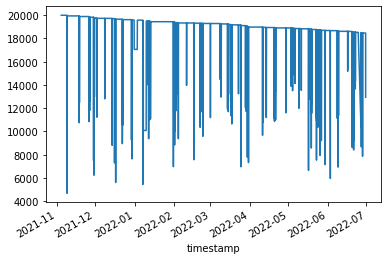

In [118]:
port.cash().plot()

In [119]:
port.stats()

Start                               2021-11-04 17:00:00
End                                 2022-06-30 16:45:00
Period                                160 days 03:30:00
Start Value                                     20000.0
End Value                                  18463.013482
Total Return [%]                              -7.684933
Benchmark Return [%]                          -9.262359
Max Gross Exposure [%]                        76.615126
Total Fees Paid                                     0.0
Max Drawdown [%]                               7.684933
Max Drawdown Duration                 157 days 20:45:00
Total Trades                                        135
Total Closed Trades                                 134
Total Open Trades                                     1
Open Trade PnL                                -5.526257
Win Rate [%]                                   5.970149
Best Trade [%]                                 0.090962
Worst Trade [%]                                 

In [120]:
port.trades.records_readable

,Exit Trade Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status,Position Id
0,0,0,13197.62,2021-11-09 05:00:00,1.161253,0.0,2021-11-09 05:30:00,1.159690,0.0,-20.630926,-0.001346,Long,Closed,0
1,1,0,12252.22,2021-11-09 06:00:00,1.161657,0.0,2021-11-09 07:30:00,1.158793,0.0,-35.097324,-0.002466,Long,Closed,1
2,2,0,7303.35,2021-11-18 11:45:00,1.136080,0.0,2021-11-18 13:15:00,1.132898,0.0,-23.237799,-0.002801,Long,Closed,2
3,3,0,8065.37,2021-11-18 17:00:00,1.137371,0.0,2021-11-18 17:15:00,1.136337,0.0,-8.338305,-0.000909,Long,Closed,3
4,4,0,6500.80,2021-11-18 18:00:00,1.138535,0.0,2021-11-19 01:15:00,1.135236,0.0,-21.447986,-0.002898,Long,Closed,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130,130,0,3983.64,2022-06-22 15:30:00,1.060831,0.0,2022-06-22 16:00:00,1.057039,0.0,-15.103485,-0.003574,Long,Closed,130
131,131,0,7666.29,2022-06-26 23:00:00,1.057916,0.0,2022-06-27 00:45:00,1.054933,0.0,-22.864375,-0.002819,Long,Closed,131
132,132,0,9287.57,2022-06-27 07:15:00,1.058363,0.0,2022-06-27 07:30:00,1.057324,0.0,-9.649607,-0.000982,Long,Closed,132
133,133,0,10026.49,2022-06-28 06:30:00,1.060606,0.0,2022-06-28 06:45:00,1.057823,0.0,-27.907068,-0.002624,Long,Closed,133


In [14]:
#  PnL = (Size * Avg Entry Price + Entry Fees) - (Size * Avg Exit Price - Exit Fees)
( (0.13 * 1.161253 + 0.000075) - (0.13 * 1.159875 - 0.000075) )

0.00032914000000000554

In [44]:
((1.161253 - 1.159875) / 0.0001) * 10 * 0.13

17.914000000001316

In [13]:
result_short[result_short['short_entries'] == True]

,open,high,low,close,adj close,volumn,EMA_200,RSI_10,ATRr_17,entries,exits,short_entries,short_exits,price_action,prev_rsi,lot_size
timestamp,,,,,,,,,,,,,,,,
2021-11-10 07:30:00,1.157140,1.157274,1.156738,1.156872,1.156872,0,1.158316,22.476142,0.000566,False,False,True,False,1.157140,29.277417,0.10
2021-11-10 11:45:00,1.155268,1.155668,1.154868,1.155268,1.155268,0,1.158136,25.212227,0.000742,False,False,True,False,1.155268,29.840105,0.06
2021-11-10 15:15:00,1.154868,1.155268,1.153270,1.153270,1.153270,0,1.157819,25.011589,0.001036,False,False,True,False,1.154868,33.133020,0.05
2021-11-10 17:00:00,1.151941,1.152339,1.151013,1.151145,1.151145,0,1.157441,25.836950,0.001038,False,False,True,False,1.151941,30.844960,0.05
2021-11-10 19:45:00,1.149557,1.149690,1.148633,1.148633,1.148633,0,1.156674,24.375830,0.001029,False,False,True,False,1.149557,29.363958,0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-28 12:15:00,1.055966,1.055966,1.055186,1.055855,1.055855,0,1.057337,26.019987,0.000819,False,False,True,False,1.055966,29.197343,0.08
2022-06-29 04:45:00,1.051635,1.051746,1.050751,1.050751,1.050751,0,1.055188,23.084197,0.000642,False,False,True,False,1.051635,29.490225,0.09
2022-06-29 16:30:00,1.046244,1.046244,1.045478,1.045697,1.045697,0,1.053362,26.749044,0.001003,False,False,True,False,1.046244,30.669499,0.07


In [112]:
port2 = vbt.Portfolio.from_signals(result_short.price_action,
#                                   entries=result_long.entries.astype('bool'),
#                                   exits=result_long.exits.astype('bool'),
                                  short_entries=result_short.short_entries.astype('bool'),
                                  short_exits=result_short.short_exits.astype('bool'),
#                                   direaction='shortonly',
                                  size=result_short.lot_size,
                                  size_type=0,
                                  freq="15m",
                                  init_cash=20000,
                                  fees=0.0005, 
                                  slippage=0.001
                                 )

In [113]:
port2.plot().show()

<AxesSubplot:xlabel='timestamp'>

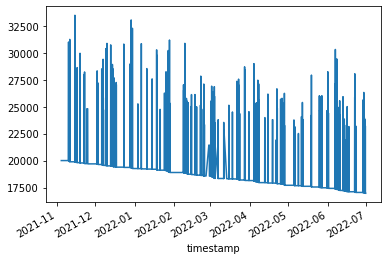

In [114]:
port2.cash().plot()

In [115]:
port2.stats()

Start                               2021-11-04 17:00:00
End                                 2022-06-30 16:45:00
Period                                160 days 03:30:00
Start Value                                     20000.0
End Value                                  16962.105973
Total Return [%]                              -15.18947
Benchmark Return [%]                           0.120782
Max Gross Exposure [%]                     72550.825576
Total Fees Paid                             1343.742139
Max Drawdown [%]                              15.192635
Max Drawdown Duration                 156 days 19:30:00
Total Trades                                        176
Total Closed Trades                                 176
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                   1.136364
Best Trade [%]                                 0.043494
Worst Trade [%]                               -0